Only Yuan should make changes to this file. 

In [1]:
import pandas as pd

In [13]:
import numpy as np

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns 

In [2]:
import sys 
sys.path.append("../../")

In [3]:
from proj_mod import data_shifting

In [4]:
all_data=pd.read_csv("../../data/processed/all_data_collection.csv")

In [5]:
all_data.columns

Index(['Date', 'tech_index_daily_pro_change', 'cop_daily_pro_change',
       'gold_daily_pro_change', 'silv_daily_pro_change',
       'pal_daily_pro_change', 'plat_daily_pro_change',
       'crude_oil_daily_pro_change', 'fed_dff_daily',
       'ppi314_monthly_pro_change', 'ppi332_monthly_pro_change',
       'ppi333_monthly_pro_change', 'ppi334_monthly_pro_change',
       'ppi335_monthly_pro_change', 'ppi336_monthly_pro_change',
       'ppi339_monthly_pro_change', 'ppi516_monthly_pro_change',
       'ppi517_monthly_pro_change', 'ppi5132_monthly_pro_change',
       'ppi5182_monthly_pro_change'],
      dtype='object')

In [6]:
all_data_extended = all_data.copy(deep=True)

In [8]:
lst_cols_shift=['tech_index_daily_pro_change', 'cop_daily_pro_change',
       'gold_daily_pro_change', 'silv_daily_pro_change',
       'pal_daily_pro_change', 'plat_daily_pro_change',
       'crude_oil_daily_pro_change']

In [9]:
for col in lst_cols_shift: 
    all_data_extended=data_shifting.shifter(df_in=all_data_extended,str_col=col,int_shift=1)
    all_data_extended=data_shifting.shifter(df_in=all_data_extended,str_col=col,int_shift=2)

In [10]:
all_data_extended

,Date,tech_index_daily_pro_change,cop_daily_pro_change,gold_daily_pro_change,silv_daily_pro_change,pal_daily_pro_change,plat_daily_pro_change,crude_oil_daily_pro_change,fed_dff_daily,ppi314_monthly_pro_change,...,gold_daily_pro_change_shifted_by_1,gold_daily_pro_change_shifted_by_2,silv_daily_pro_change_shifted_by_1,silv_daily_pro_change_shifted_by_2,pal_daily_pro_change_shifted_by_1,pal_daily_pro_change_shifted_by_2,plat_daily_pro_change_shifted_by_1,plat_daily_pro_change_shifted_by_2,crude_oil_daily_pro_change_shifted_by_1,crude_oil_daily_pro_change_shifted_by_2
0,2014-01-02,-0.751953,-0.352994,-0.105993,3.539095,0.828394,1.134643,-3.106599,0.08,2.827965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-03,-0.522898,-0.783676,0.000000,0.000000,0.130092,0.683469,-1.550712,0.08,2.827965,...,-0.105993,NaN,3.539095,NaN,0.828394,NaN,1.134643,NaN,-3.106599,NaN
2,2014-01-06,-0.022589,0.134128,1.044727,-0.124205,0.998359,0.155565,-0.564070,0.08,2.827965,...,0.000000,-0.105993,0.000000,3.539095,0.130092,0.828394,0.683469,1.134643,-1.550712,-3.106599
3,2014-01-07,0.905810,0.000000,-0.678514,-1.571905,0.433311,-0.070602,0.256877,0.07,2.827965,...,1.044727,0.000000,-0.124205,0.000000,0.998359,0.130092,0.155565,0.683469,-0.564070,-1.550712
4,2014-01-08,-0.198846,-0.506028,-0.333442,-1.253348,-0.458406,-0.084782,-1.430554,0.07,2.827965,...,-0.678514,1.044727,-1.571905,-0.124205,0.433311,0.998359,-0.070602,0.155565,0.256877,-0.564070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2563,2024-10-24,0.014143,0.886590,0.713997,-0.130653,7.209738,0.382858,-0.753162,4.83,-0.554093,...,-1.102861,0.755464,-3.443431,2.836419,0.375940,2.504817,-0.737137,2.581413,-1.909674,2.427184
2564,2024-10-25,0.589392,-0.073233,0.208295,-0.038653,2.969432,-0.168621,2.162085,4.83,-0.554093,...,0.713997,-1.102861,-0.130653,-3.443431,7.209738,0.375940,0.382858,-0.737137,-0.753162,-1.909674
2565,2024-10-28,0.079416,0.000000,0.051054,0.666270,-98.982188,0.847772,-6.124737,4.83,-0.554093,...,0.208295,0.713997,-0.038653,-0.130653,2.969432,7.209738,-0.168621,0.382858,2.162085,-0.753162
2566,2024-10-29,0.999780,-0.073287,0.918501,1.273490,9891.666667,1.759734,-0.253807,4.83,-0.554093,...,0.051054,0.208295,0.666270,-0.038653,-98.982188,2.969432,0.847772,-0.168621,-6.124737,2.162085


In [19]:
all_data_extended_train=all_data_extended[all_data_extended["Date"]<"2024-01-01"].dropna()
all_data_extended_test=all_data_extended[all_data_extended["Date"]>="2024-01-01"].dropna()

In [12]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [22]:
from sklearn.metrics import mean_squared_error

In [21]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
#import numpy as np
#import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import roc_auc_score
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show

In [23]:
ebm_pipe=Pipeline([("std",StandardScaler()),("ebm",ExplainableBoostingRegressor())])

In [24]:
X_train=all_data_extended_train.iloc[:,2:]
y_train=all_data_extended_train.iloc[:,1]
X_test=all_data_extended_test.iloc[:,2:]
y_test=all_data_extended_test.iloc[:,1]

In [25]:
ebm_pipe.fit(X_train,y_train)

Pipeline(steps=[('std', StandardScaler()),
                ('ebm', ExplainableBoostingRegressor())])

In [26]:
pred=ebm_pipe.predict(X_test)

In [27]:
mean_squared_error(y_pred=pred,y_true=y_test)

1.5988270435916487

This is a record that the mse trained with all parameters within all_data_extended_train is 1.5988270435916487. 

In [46]:
show(ebm_pipe["ebm"].explain_global())

In [49]:
show(ebm_pipe["ebm"].explain_local(X_test[:5], y_test[:5]), 0)

In [36]:
df_all_t_and_p=pd.DataFrame({"Date": all_data_extended_test["Date"].values, "True": y_test.values, "Pred":pred})

In [37]:
df_all_t_and_p["Date"]=pd.to_datetime(df_all_t_and_p["Date"])

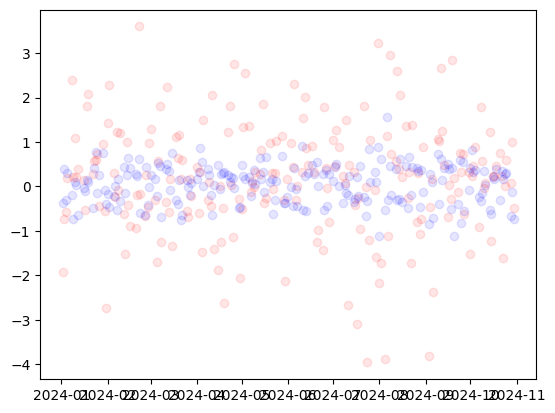

In [38]:
plt.scatter(x=df_all_t_and_p["Date"], y=df_all_t_and_p["True"], label="True", alpha=0.1,c="r")
plt.scatter(x=df_all_t_and_p["Date"], y=df_all_t_and_p["Pred"], label="Pred",alpha=0.1, c="b")
plt.show()

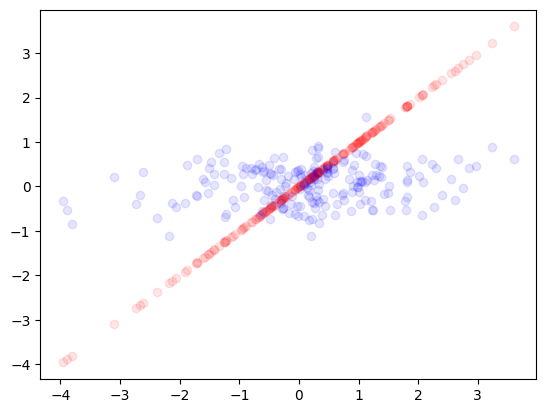

In [40]:
plt.scatter(x=df_all_t_and_p["True"], y=df_all_t_and_p["True"], alpha=0.1,c="r")
plt.scatter(x=df_all_t_and_p["True"], y=df_all_t_and_p["Pred"], alpha=0.1,c="b")